# Question 2

## By: Shifra Abittan & Guy Bar Yosef



### a.)

A blockchain is made out of a class made out of two attributes, a chain of blocks and a list of current outstanding transactions. In the below implementation, these are both list data structures. 
- The methods of this class will be added later on. 

The block is made out of:
- An index, which puts them in a chronological order.
- A timestamp, which attaches to the block a time.
- A list of transactions, each one including a sender, a recipient, and an amount.
- The hash of the previous block in the chain. 

To add a transaction, you append it to the end of the list of outstanding transactions in the blockchain class and then return the index of the block that this transaction will be inside of.

To create a new block we append to the existing chain a block with the following parameters:
- Index: Which will be the current length of the chain plus one.
- Timestamp: Which gives the block a time associated with it.
- Transactions: Attaches the list of current outstanding transactions.
- Proof: Which will be given as a proof-of-work.
- Previous Hash: Either the value is stored in a variable named previous_hash or a method is called to hash the
last block included in the chain.

Then the list of current outstanding transactions becomes empty.

Proof-of-Work algorithm appends a value and a nonce and then loops through all the nonces until some condition, in this case that output has 4 leading zeros, gets met. This is used to choose which node gets to add the next block, which is the process called 'Mining'.
- It needs to be difficult to compute and easy to verify.

### B.) 
For simplification purposes, the author used the proof of the previous block concatenated with a nonce as the input to the proof_of_work function, which verifies whether this input satisfies the hash requirement, which is to have 4 leading zeros in the output. 
In bitcoin, the value that gets inputed into the proof_of_work function is the whole block, including the list of outstanding transactions, the previous block's hash, the current block's index, and a nonce. 
Also in bitcoin, the proof_of_work funciton varies in difficulty so that the average amount of time between blocks mined is 10 minutes, while in this implementation the difficulty is constant (4 leading zeros).


### c.)

Flask: Flask is a framework whose overall purpose is to connect between URL inquries and some function or code called the 'view function'. The way we are using Flask is to streamline and allow the users to interact with the blockchain.

Endpoints: Endpoints take input from the user and determine what part of the code should handle the inputed request. It is usually the name of some view function, but can be changed by coder.

The 3 methods that we are using are:

/transactions/new:
- Firstly, this method checks that the user inputed a data containing a sender, reciever, and an amount through POST request.
- Once that is confirmed, it will call the new_transaction() method of the Blockchain class and add the transaction to the outstanding transaction list.
- If successful, it will return to the user a success message with the index of the block that trasaction will be in if mined.
- If the user did not input the correct information in the URL, it will return a 'missing information' error.

/mine:
- This view function does 3 things:
    - Firstly, it will find a valid proof to the current block.
    - Once that proof is found, it will add to the list of outstanding transactions of said block a transaction rewarding the miner with 1 coin.
    - Lastly, it calls the Blockchain class' 'new_block' method, appending the current block to the chain. After this it returns a success message with the block's index, transaction list, proof and previous hash.
    
/chain:
- This view function simply returns the current blockchain as well as its length.




In [ ]:
import hashlib
import requests
import json
from textwrap import dedent
from time import time
from uuid import uuid4
from urllib.parse import urlparse

from flask import Flask, jsonify, request


class Blockchain(object):
    def __init__(self):
        self.current_transactions = []
        self.chain = []
        self.nodes = set()

        # Create the genesis block
        self.new_block(previous_hash=1, proof=100)

    def new_block(self, proof, previous_hash=None):
        """
        Create a new Block in the Blockchain
        :param proof: <int> The proof given by the Proof of Work algorithm
        :param previous_hash: (Optional) <str> Hash of previous Block
        :return: <dict> New Block
        """

        block = {
            'index': len(self.chain) + 1,
            'timestamp': time(),
            'transactions': self.current_transactions,
            'proof': proof,
            'previous_hash': previous_hash or self.hash(self.chain[-1]),
        }

        # Reset the current list of transactions
        self.current_transactions = []

        self.chain.append(block)
        return block

    def new_transaction(self, sender, recipient, amount):
        """
        Creates a new transaction to go into the next mined Block
        :param sender: <str> Address of the Sender
        :param recipient: <str> Address of the Recipient
        :param amount: <int> Amount
        :return: <int> The index of the Block that will hold this transaction
        """
        self.current_transactions.append({
            'sender': sender,
            'recipient': recipient,
            'amount': amount,
        })

        return self.last_block['index'] + 1

    @property
    def last_block(self):
        return self.chain[-1]

    @staticmethod
    def hash(block):
        """
        Creates a SHA-256 hash of a Block
        :param block: <dict> Block
        :return: <str>
        """

        # We must make sure that the Dictionary is Ordered, or we'll have inconsistent hashes
        block_string = json.dumps(block, sort_keys=True).encode()
        return hashlib.sha256(block_string).hexdigest()
    
    def proof_of_work(self, last_proof):
        """
        Simple Proof of Work Algorithm:
         - Find a number p' such that hash(pp') contains leading 4 zeroes, where p is the previous p'
         - p is the previous proof, and p' is the new proof
        :param last_proof: <int>
        :return: <int>
        """

        proof = 0
        while self.valid_proof(last_proof, proof) is False:
            proof += 1

        return proof

    @staticmethod
    def valid_proof(last_proof, proof):
        """
        Validates the Proof: Does hash(last_proof, proof) contain 4 leading zeroes?
        :param last_proof: <int> Previous Proof
        :param proof: <int> Current Proof
        :return: <bool> True if correct, False if not.
        """

        guess = f'{last_proof}{proof}'.encode()
        guess_hash = hashlib.sha256(guess).hexdigest()
        return guess_hash[:4] == "0000"
    
    def register_node(self, address):
        """
        Add a new node to the list of nodes
        :param address: <str> Address of node. Eg. 'http://192.168.0.5:5000'
        :return: None
        """

        parsed_url = urlparse(address)
        self.nodes.add(parsed_url.netloc)
        
    def valid_chain(self, chain):
        """
        Determine if a given blockchain is valid
        :param chain: <list> A blockchain
        :return: <bool> True if valid, False if not
        """

        last_block = chain[0]
        current_index = 1

        while current_index < len(chain):
            block = chain[current_index]
            print(f'{last_block}')
            print(f'{block}')
            print("\n-----------\n")
            # Check that the hash of the block is correct
            if block['previous_hash'] != self.hash(last_block):
                return False

            # Check that the Proof of Work is correct
            if not self.valid_proof(last_block['proof'], block['proof']):
                return False

            last_block = block
            current_index += 1

        return True

    
    def resolve_conflicts(self):
        """
        This is our Consensus Algorithm, it resolves conflicts
        by replacing our chain with the longest one in the network.
        :return: <bool> True if our chain was replaced, False if not
        """

        neighbours = self.nodes
        new_chain = None

        # We're only looking for chains longer than ours
        max_length = len(self.chain)

        # Grab and verify the chains from all the nodes in our network
        for node in neighbours:
            response = requests.get(f'http://{node}/chain')

            if response.status_code == 200:
                length = response.json()['length']
                chain = response.json()['chain']

                # Check if the length is longer and the chain is valid
                if length > max_length and self.valid_chain(chain):
                    max_length = length
                    new_chain = chain

        # Replace our chain if we discovered a new, valid chain longer than ours
        if new_chain:
            self.chain = new_chain
            return True

        return False


# Instantiate our Node
app = Flask(__name__)

# Generate a globally unique address for this node
node_identifier = str(uuid4()).replace('-', '')

# Instantiate the Blockchain
blockchain = Blockchain()


@app.route('/mine', methods=['GET'])
def mine():
    # We run the proof of work algorithm to get the next proof...
    last_block = blockchain.last_block
    last_proof = last_block['proof']
    proof = blockchain.proof_of_work(last_proof)

    # We must receive a reward for finding the proof.
    # The sender is "0" to signify that this node has mined a new coin.
    blockchain.new_transaction(
        sender="0",
        recipient=node_identifier,
        amount=1,
    )

    # Forge the new Block by adding it to the chain
    previous_hash = blockchain.hash(last_block)
    block = blockchain.new_block(proof, previous_hash)

    response = {
        'message': "New Block Forged",
        'index': block['index'],
        'transactions': block['transactions'],
        'proof': block['proof'],
        'previous_hash': block['previous_hash'],
    }
    return jsonify(response), 200
  
    
    
@app.route('/transactions/new', methods=['POST'])
def new_transaction():
    values = request.get_json()

    # Check that the required fields are in the POST'ed data
    required = ['sender', 'recipient', 'amount']
    if not all(k in values for k in required):
        return 'Missing values', 400

    # Create a new Transaction
    index = blockchain.new_transaction(values['sender'], values['recipient'], values['amount'])

    response = {'message': f'Transaction will be added to Block {index}'}
    return jsonify(response), 201



@app.route('/chain', methods=['GET'])
def full_chain():
    response = {
        'chain': blockchain.chain,
        'length': len(blockchain.chain),
    }
    return jsonify(response), 200


@app.route('/nodes/register', methods=['POST'])
def register_nodes():
    values = request.get_json()

    nodes = values.get('nodes')
    if nodes is None:
        return "Error: Please supply a valid list of nodes", 400

    for node in nodes:
        blockchain.register_node(node)

    response = {
        'message': 'New nodes have been added',
        'total_nodes': list(blockchain.nodes),
    }
    return jsonify(response), 201


@app.route('/nodes/resolve', methods=['GET'])
def consensus():
    replaced = blockchain.resolve_conflicts()

    if replaced:
        response = {
            'message': 'Our chain was replaced',
            'new_chain': blockchain.chain
        }
    else:
        response = {
            'message': 'Our chain is authoritative',
            'chain': blockchain.chain
        }

    return jsonify(response), 200


if __name__ == '__main__':
    app.run(host='0.0.0.0', port=5000)

### d.)


Adding a transaction to the outstanding transaction list, transferring one coin:

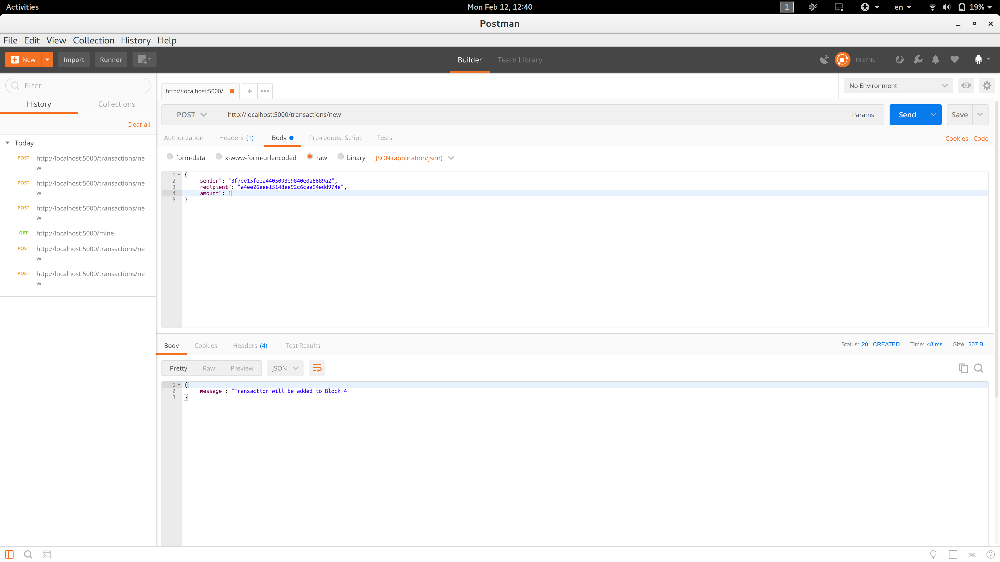

Mining the next block, which includes the transaction from above as well as the mining reward:

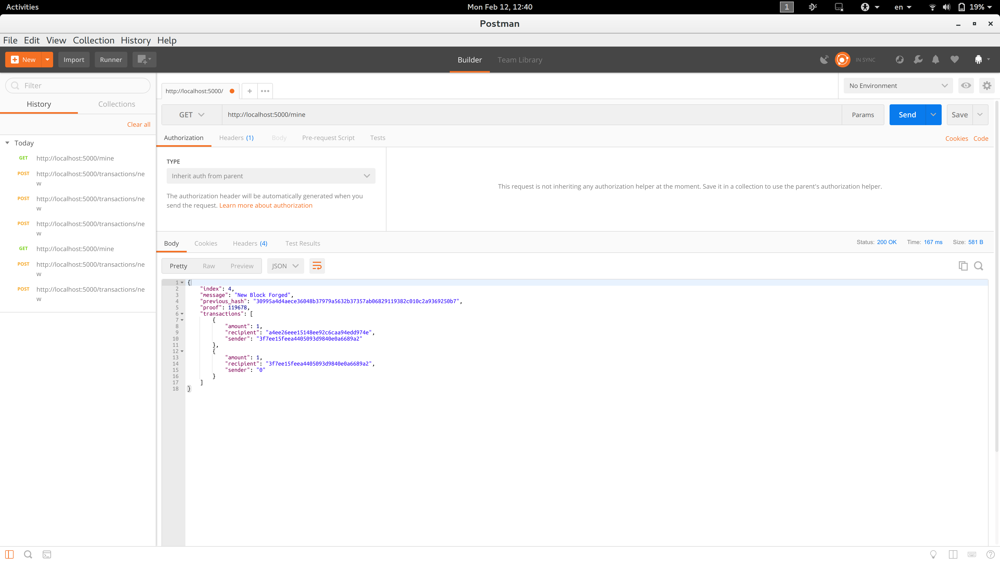

### e)

A conflict is detected when one calls the nodes/resolve method.

valid_chain: Confirms the validity of a blockchain by going through the blocks and confirming that the previous hashes match..

resolve_chain: The algorithm resolves conflicts by checking the length of the blockchain belonging to each node in the network, finally adopting the longest blockchain.

Addition of nodes to the network:
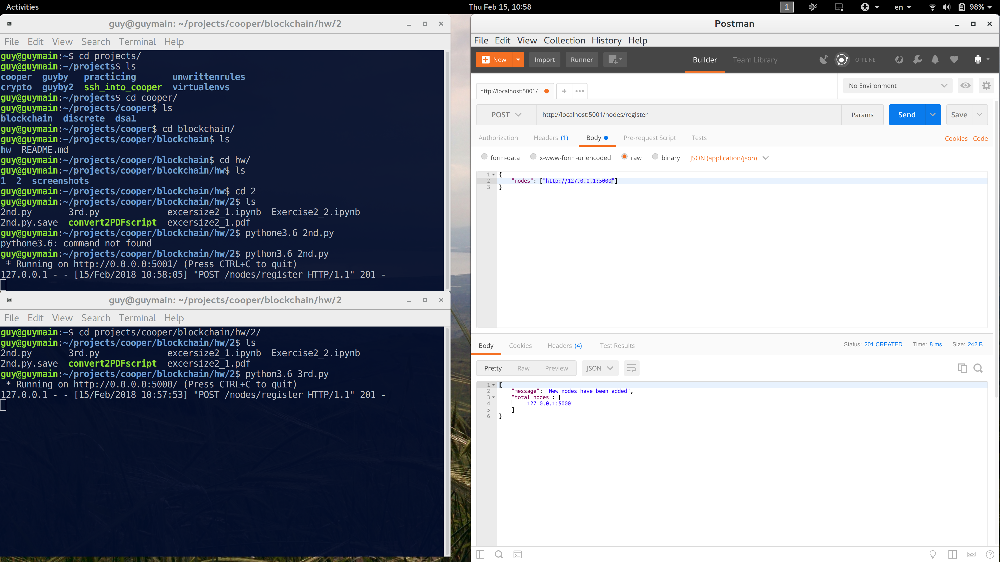

Each node's blockchain is incongruous. 
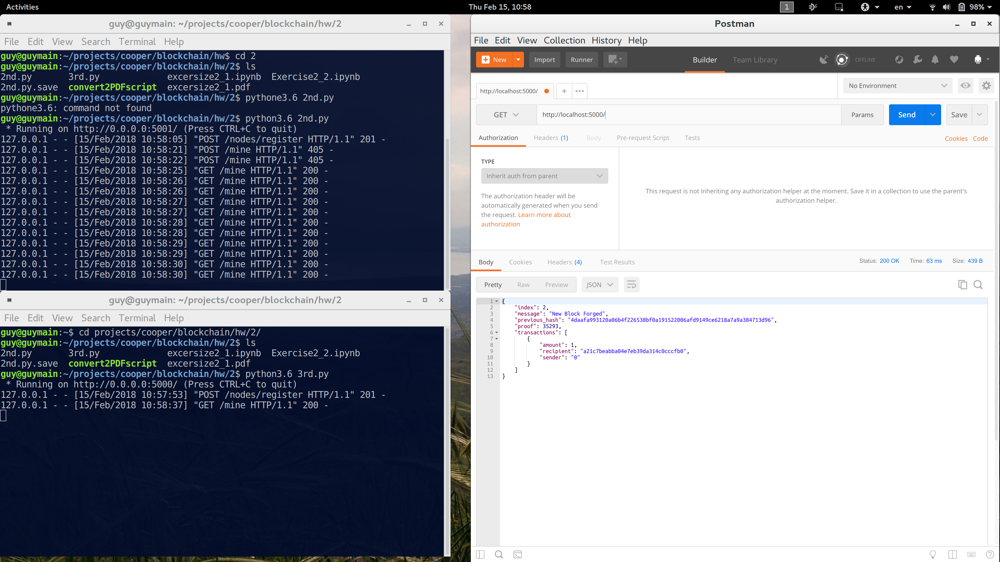

After calling the nodes/resolve method, the blockchain network returns to consensus.
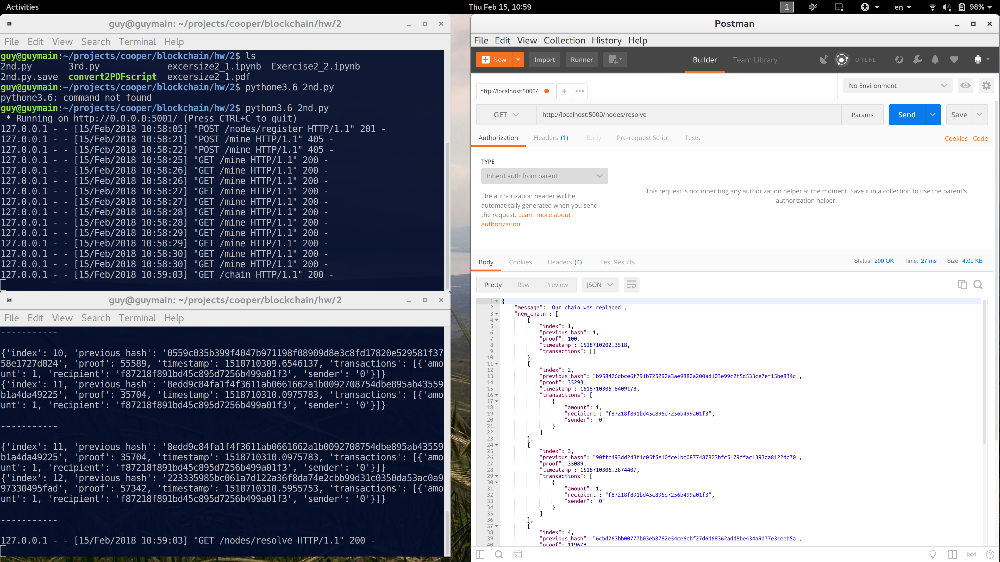